# Using linear regression to predict the joints
***

### Datasets: [subset](http://cims.nyu.edu/~tompson/flic_plus.htm) of full [FLIC](http://vision.grasp.upenn.edu/cgi-bin/index.php?n=VideoLearning.FLIC)
- Number of all the training images is 17380
    - Divided into validation sample 17380 * 20% = 3476
    - Divided into training sample 17380 - (17380 * 20%) = 13904
- Number of test images is 3548
- Number of joints is 7 (x, y)
    
### Data preprocessing
- Using the ground truth coordinates of joints to decide a bounding box (human detector)
- Add some noise (padding, shift) to the bounding box by uniform distribution
- Crop the original image acoording to the bounding box
- Resize the cropped image to 100x100

### Algorithm: Linear regression, **y** = **XW** + **b**, and y is a vector coordinates of joints
- Model
    - Build a linear model for every coordinate (x, y) of joints, i.e., 7*2=14 linear model in total
    - Use L2-norm loss (square error) $\sum_i^n (f(x_i) - y_i)^2$ for each model
    - The total loss is the sum of that for every model
    - We can regard all the models as a single Neural Network (no hidden layer) model with 14 output for regression
- Optimization
    - Use Stochastic/Batch gradient descent (SGD/BGD) to update weights and biases with batch size 32
- Validation
    - Compute the loss of validation data at the end of each epoch
    - Compute the loss of subset of training datasets which has the same number as validation datasets at each epoch
    - Plot the two loss curve above at the end of each epoch
    - Plot the loss decay of each batch
    - Plot original, transformed and predicted joints on the image

### Results

1. [Use all the pixels of transformed pictures as inputs and use SGD](#all_sgd)
2. [Use all the pixels of transformed pictures as inputs and use BGD](#all_bgd)
3. [Use SIFT based on Bag-of-Word algorithm and use SGD](#sift)
4. [Use pixels of patch images around the joints and use SGD](#patch)

In [145]:
# A bit of setup
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (15.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# for auto-reloading extenrnal modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [146]:
# set up fransform parameters to find the bounding box, crop and resize the images
# transfrom parameters
from my_scripts.transform import Transform
pad_inf = 1.5 # infimum scale
pad_sup = 2.0 # supremum scale
size = 100 # resize size
shift = 3 # radomly shift the bounding box
lcn = True # local contrast normalization
trans = Transform(pad_inf, pad_sup, size=size, shift=shift, lcn=lcn)

In [147]:
# Get some useful variables and reuse trans param above
data_dir = 'data/FLIC-full' # store image 
train_info_file = '%s/train_joints.csv' % data_dir  # store corrdinates of joints for training data
test_info_file = '%s/test_joints.csv' % data_dir  # store corrdinates of joints for test data
train_info = np.array([l.strip() for l in open(train_info_file).readlines()])
test_info = np.array([l.strip() for l in open(test_info_file).readlines()])
N_train = len(train_info)
N_test = len(test_info)
N = 5  # How many pictures to show
mask_train = np.random.choice(N_train, N, replace=False)
mask_test = np.random.choice(N_test, N, replace=False)
train_show = train_info[mask_train]
test_show = test_info[mask_test]
print 'Total number of train datasets: %d' % N_train
print 'Total number of test datasets: %d' % N_test
print 'Total number of test pictures: %d' % N

Total number of train datasets: 17380
Total number of test datasets: 3548
Total number of test pictures: 5


<a name='all_sgd'></a>
## 1. All the pixels of transformed pictures

In [148]:
import cPickle as pickle
result_dir = 'results/LinearNet_flic_2015-08-06-10-45-10/'
results_pickle_file = 'results/sgd_trained_resutls.chainer'
# get the trained model
with open(results_pickle_file, 'rb') as pickle_file:
    trained_model = pickle.load(pickle_file)[0]

### 1.1 Show the batch loss curve

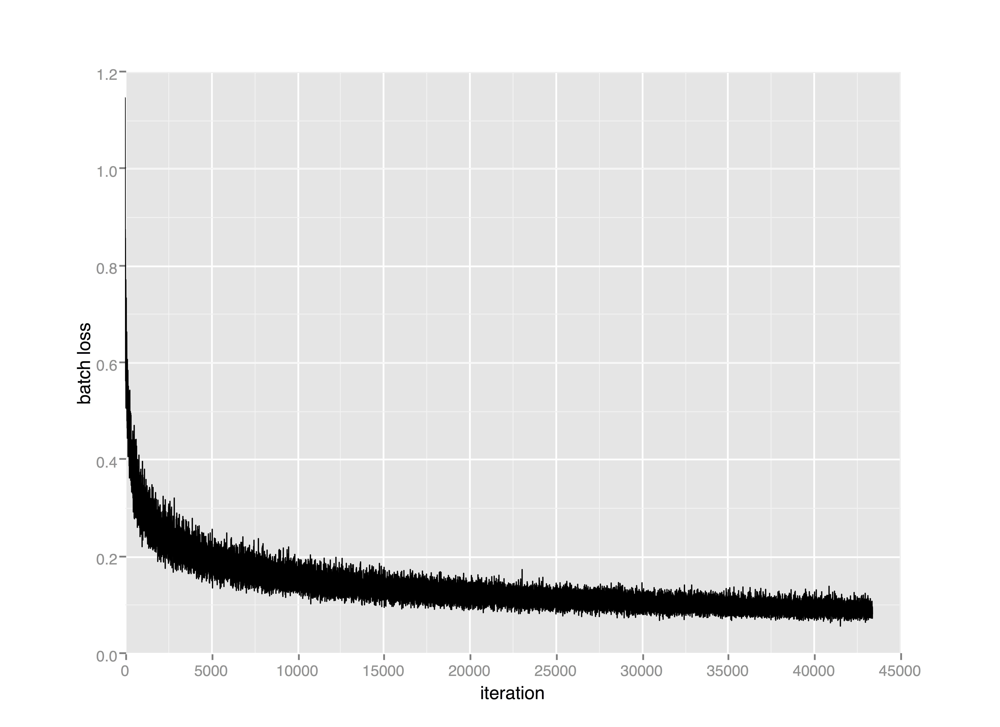

In [149]:
from IPython.display import Image
loss_file_name = result_dir + 'batch_loss.jpg'
Image(filename=loss_file_name, width=900)

### 1.2 Show the loss at the end of each epoch

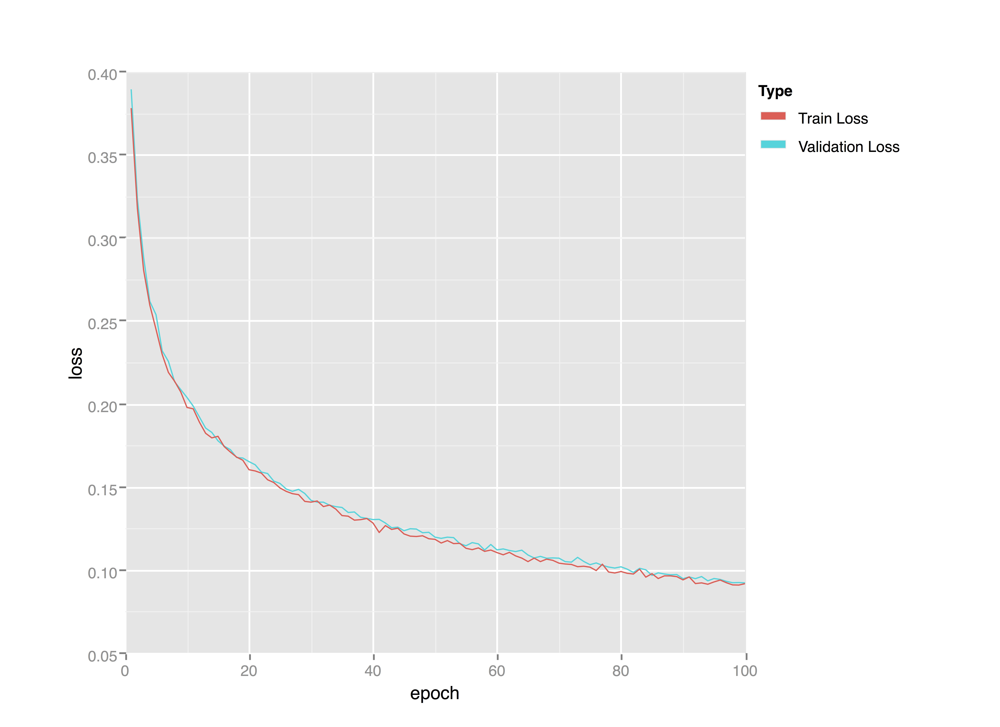

In [150]:
loss_file_name = result_dir + 'val_loss.jpg'
Image(filename=loss_file_name, width=900)

### 1.3 Show the images with joints
- The first row is the original images with ground truth joints
- The second row is the transformed images (resize to 220x220) with transformed groud truth joints
- The third row is the transformed images with predict joints which is trained by transformed images

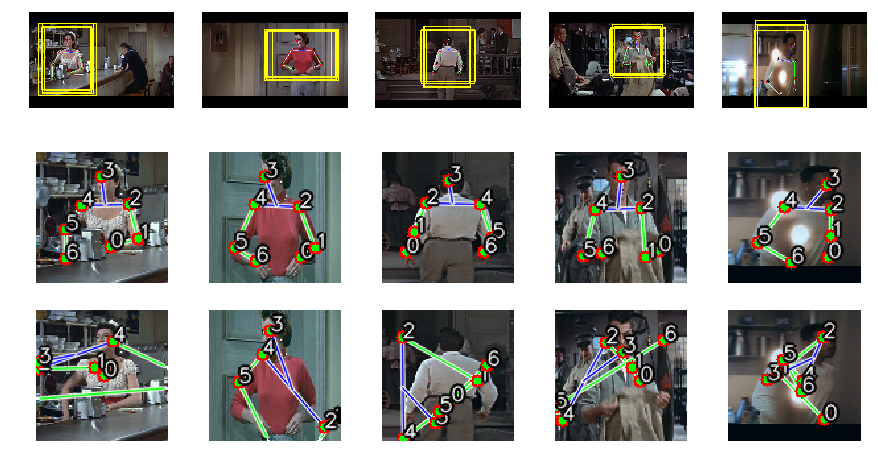

In [151]:
# Show training images
from my_scripts.test_flic_dataset import show_ori_trans_pred_joints
show_ori_trans_pred_joints(N, train_show, data_dir, trans, trained_model)

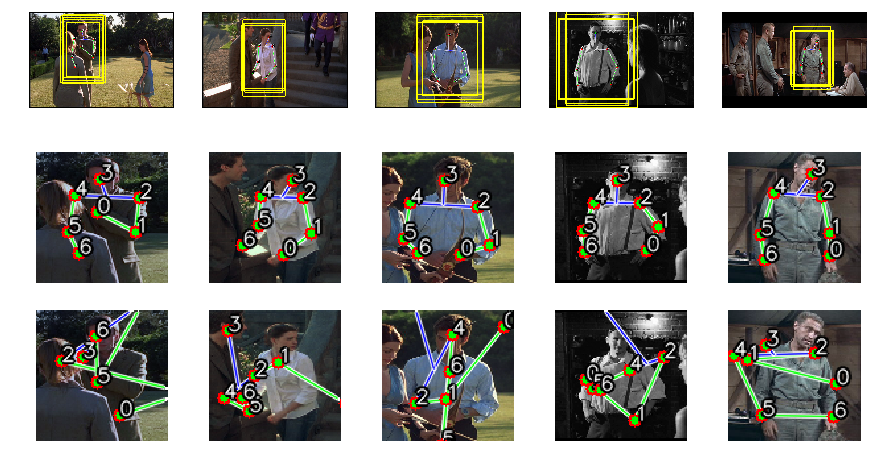

In [152]:
# Show test images
show_ori_trans_pred_joints(N, test_show, data_dir, trans, trained_model)

<a name='all_bgd'></a>
## 2. All the pixels of transformed pictures with BGD

In [153]:
result_dir = 'results/LinearNet_flic_2015-08-04-00-06-53/'
results_pickle_file = 'results/bgd_trained_resutls.chainer'
# get the trained model
with open(results_pickle_file, 'rb') as pickle_file:
    trained_model = pickle.load(pickle_file)[0]

### 2.1 Show the batch loss curve

loss_file_name = result_dir + 'batch_loss.jpg'
Image(filename=loss_file_name, width=900)

### 2.2 Show the loss at the end of each epoch

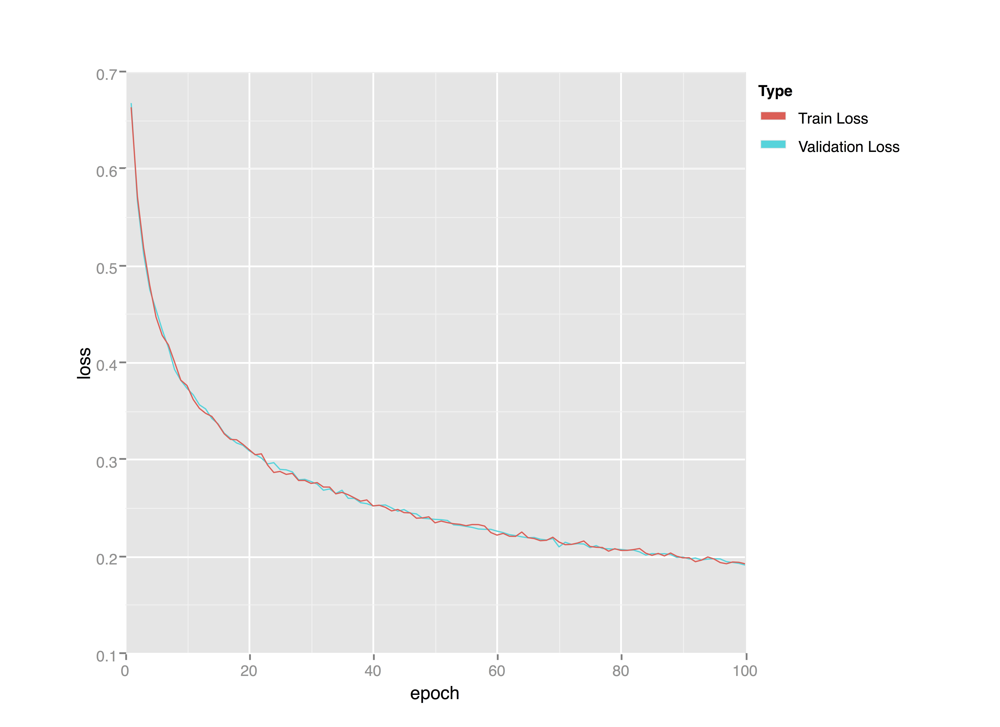

In [154]:
loss_file_name = result_dir + 'loss.jpg'
Image(filename=loss_file_name, width=900)

### 2.3 Show the images with joints
- The first row is the original images with ground truth joints
- The second row is the transformed images (resize to 220x220) with transformed groud truth joints
- The third row is the transformed images with predict joints which is trained by transformed images

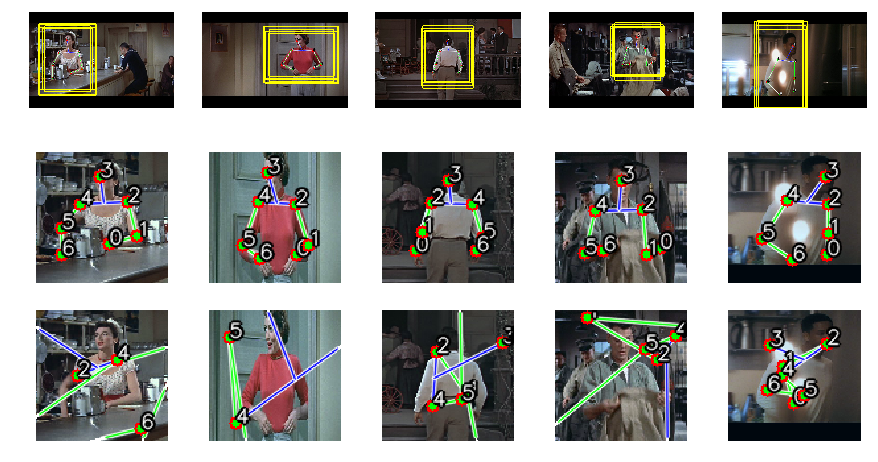

In [155]:
# Show training images
from my_scripts.test_flic_dataset import show_ori_trans_pred_joints
show_ori_trans_pred_joints(N, train_show, data_dir, trans, trained_model)

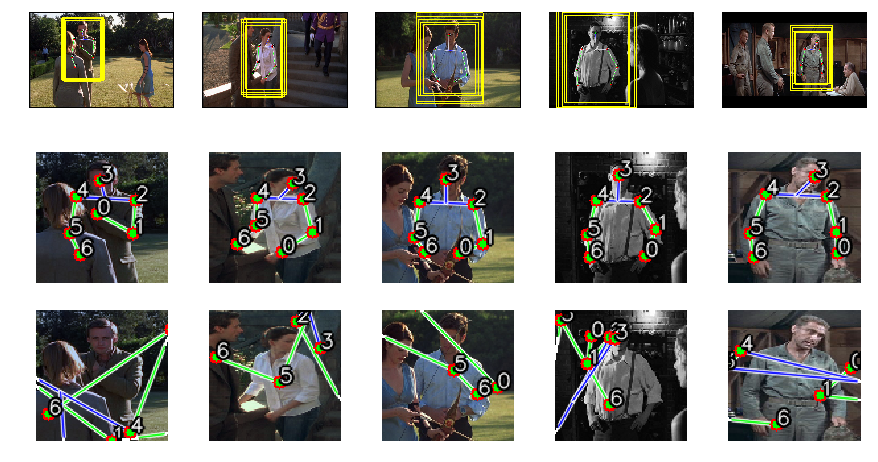

In [156]:
# Show test images
show_ori_trans_pred_joints(N, test_show, data_dir, trans, trained_model)

<a name='sift'></a>
## 3. SIFT of transformed pictures with BGD

In [157]:
import cPickle as pickle
result_dir = 'results/LinearNet_flic_sift_2015-08-06-21-48-18/'
results_pickle_file = 'results/sift_trained_resutls.chainer'
# get the trained model
with open(results_pickle_file, 'rb') as pickle_file:
    trained_model = pickle.load(pickle_file)[0]

### 3.1 Show the batch loss curve

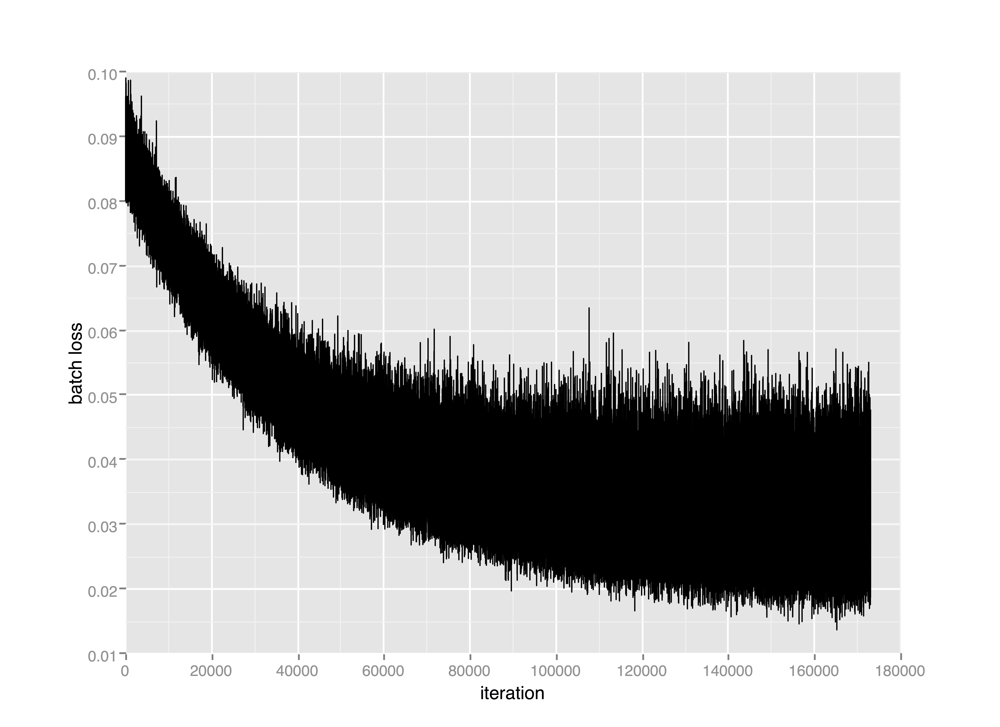

In [158]:
loss_file_name = result_dir + 'batch_loss.jpg'
Image(filename=loss_file_name, width=900)

### 3.2 Show the loss at the end of each epoch

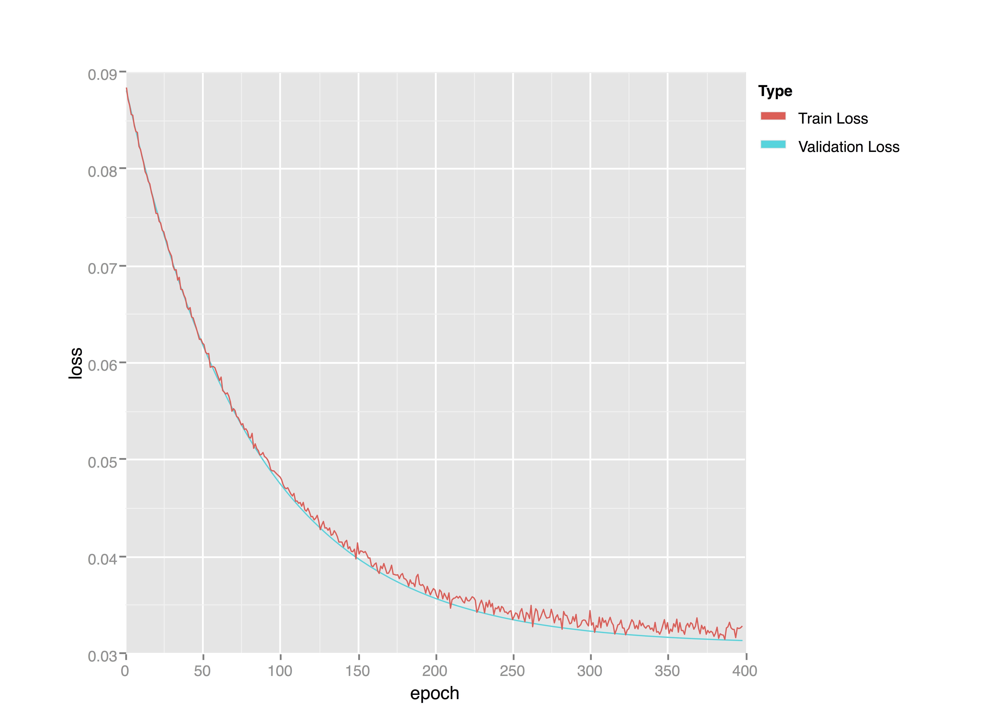

In [159]:
loss_file_name = result_dir + 'loss.jpg'
Image(filename=loss_file_name, width=900)

### 3.3 Show the images with joints
- The first row is the original images with ground truth joints
- The second row is the transformed images (resize to 220x220) with transformed groud truth joints
- The third row is the transformed images with predict joints which is trained by transformed images

In [160]:
sift_data_fn = 'results/sift_results.sift'
with open(sift_data_fn, 'rb') as pickle_file:
    X_train, Y_train, X_test, Y_test = pickle.load(pickle_file)
X_train_plot = X_train[mask_train]
y_train_plot = Y_train[mask_train]
X_test_plot = X_test[mask_test]
y_test_plot = Y_test[mask_test]

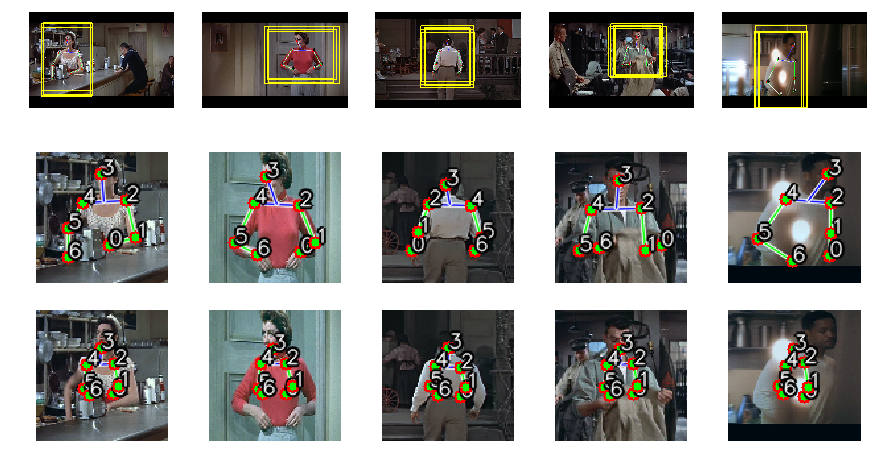

In [161]:
# Show test images
from my_scripts.test_flic_dataset import draw_joints
_, preds = trained_model.forward(X_train_plot, y_train_plot, train=False)

ori_imgs = np.zeros((N, 480, 720, 3))
tran_imgs = np.zeros((N, size, size, 3))
pred_imgs = np.zeros((N, size, size, 3))
num_bounding_box = 5

for i, x in enumerate(train_show):
    x = x.strip().split(',')
    img_file_name = '%s/images/%s' % (data_dir, x[0])
    ori_joints = np.array([int(float(p)) for p in x[1:]])
    ori_img = cv.imread(img_file_name)
    # draw joints
    draw_ori_joints = zip(ori_joints[0::2], ori_joints[1::2])
    ori_img_joints = draw_joints(ori_img.copy(), draw_ori_joints)

    # get bounding box
    for j in xrange(num_bounding_box):
        trans._img = ori_img
        trans._joints = ori_joints
        x, y, w, h = trans.crop()
        # draw bouding box
        cv.rectangle(ori_img_joints, (x, y), (x + w, y+h), (0, 255, 255), thickness=3)
    ori_imgs[i] = ori_img_joints

    # tranformed image
    tran_img, tran_joints = trans.transform(img_file_name, ori_img.copy(), ori_joints.copy())
    tran_img_rev, tran_joints_rev = trans.revert(tran_img.copy(), tran_joints)
    draw_tran_joints = [tuple(p) for p in tran_joints_rev] # must tuple in opencv
    tran_imgs[i] = draw_joints(tran_img_rev.copy(), draw_tran_joints)

    # predict image
    pred_joints = preds.data[i]  # just one image
    _, pred_joints_rev = trans.revert(tran_img.copy(), pred_joints)
    draw_pred_joints = [tuple(p) for p in pred_joints_rev]
    pred_imgs[i] = draw_joints(tran_img_rev.copy(), draw_pred_joints)

for y in xrange(3):
    for i in xrange(N):
        plt_idx = y * N + i + 1
        plt.subplot(3, N, plt_idx)
        if y == 0:  # show original image
            b,g,r = cv.split(ori_imgs[i])  # get b,g,r
        elif y == 1:  # transform image
            b,g,r = cv.split(tran_imgs[i])
        else:  # predict joints
            b,g,r = cv.split(pred_imgs[i])
        rgb_img = cv.merge([r,g,b])   
        plt.imshow(rgb_img.astype('uint8'))
        plt.axis('off')
plt.show()


for i in xrange(len(mask)):
    x = train_info[mask[i]]
    x = x.strip().split(',')
    img_file_name = '%s/images/%s' % (data_dir, x[0])
    ori_img = cv.imread(img_file_name)
    ori_joints = np.array([int(float(p)) for p in x[1:]])
    # transform, i.e., cropping
    tran_img, tran_joints = trans.transform(img_file_name, ori_img.copy(), ori_joints.copy())
    _, rev_pred_joints = trans.revert(tran_img, preds.data[i])

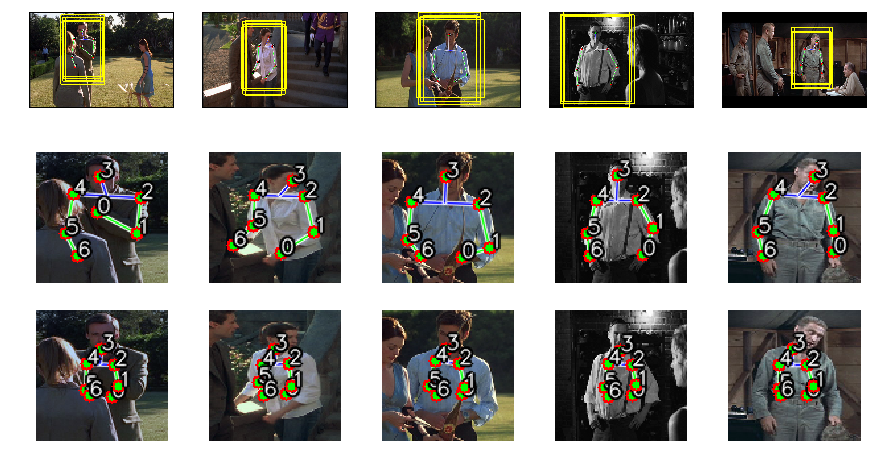

In [162]:
# Show test images
from my_scripts.test_flic_dataset import draw_joints
_, preds = trained_model.forward(X_test_plot, y_test_plot, train=False)

ori_imgs = np.zeros((N, 480, 720, 3))
tran_imgs = np.zeros((N, size, size, 3))
pred_imgs = np.zeros((N, size, size, 3))
num_bounding_box = 5

for i, x in enumerate(test_show):
    x = x.strip().split(',')
    img_file_name = '%s/images/%s' % (data_dir, x[0])
    ori_joints = np.array([int(float(p)) for p in x[1:]])
    ori_img = cv.imread(img_file_name)
    # draw joints
    draw_ori_joints = zip(ori_joints[0::2], ori_joints[1::2])
    ori_img_joints = draw_joints(ori_img.copy(), draw_ori_joints)

    # get bounding box
    for j in xrange(num_bounding_box):
        trans._img = ori_img
        trans._joints = ori_joints
        x, y, w, h = trans.crop()
        # draw bouding box
        cv.rectangle(ori_img_joints, (x, y), (x + w, y+h), (0, 255, 255), thickness=3)
    ori_imgs[i] = ori_img_joints

    # tranformed image
    tran_img, tran_joints = trans.transform(img_file_name, ori_img.copy(), ori_joints.copy())
    tran_img_rev, tran_joints_rev = trans.revert(tran_img.copy(), tran_joints)
    draw_tran_joints = [tuple(p) for p in tran_joints_rev] # must tuple in opencv
    tran_imgs[i] = draw_joints(tran_img_rev.copy(), draw_tran_joints)

    # predict image
    pred_joints = preds.data[i]  # just one image
    _, pred_joints_rev = trans.revert(tran_img.copy(), pred_joints)
    draw_pred_joints = [tuple(p) for p in pred_joints_rev]
    pred_imgs[i] = draw_joints(tran_img_rev.copy(), draw_pred_joints)

for y in xrange(3):
    for i in xrange(N):
        plt_idx = y * N + i + 1
        plt.subplot(3, N, plt_idx)
        if y == 0:  # show original image
            b,g,r = cv.split(ori_imgs[i])  # get b,g,r
        elif y == 1:  # transform image
            b,g,r = cv.split(tran_imgs[i])
        else:  # predict joints
            b,g,r = cv.split(pred_imgs[i])
        rgb_img = cv.merge([r,g,b])   
        plt.imshow(rgb_img.astype('uint8'))
        plt.axis('off')
plt.show()


for i in xrange(len(mask)):
    x = train_info[mask[i]]
    x = x.strip().split(',')
    img_file_name = '%s/images/%s' % (data_dir, x[0])
    ori_img = cv.imread(img_file_name)
    ori_joints = np.array([int(float(p)) for p in x[1:]])
    # transform, i.e., cropping
    tran_img, tran_joints = trans.transform(img_file_name, ori_img.copy(), ori_joints.copy())
    _, rev_pred_joints = trans.revert(tran_img, preds.data[i])

<a name='patch'></a>
## 4. Patch of transformed pictures with BGD

In [163]:
import cPickle as pickle
result_dir = 'results/LinearNet_flic_patch_2015-08-06-18-10-59/'
results_pickle_file = result_dir + 'epoch_370.chainermodel'
# get the trained model
with open(results_pickle_file, 'rb') as pickle_file:
    trained_model = pickle.load(pickle_file)

### 4.1 Show the batch loss curve

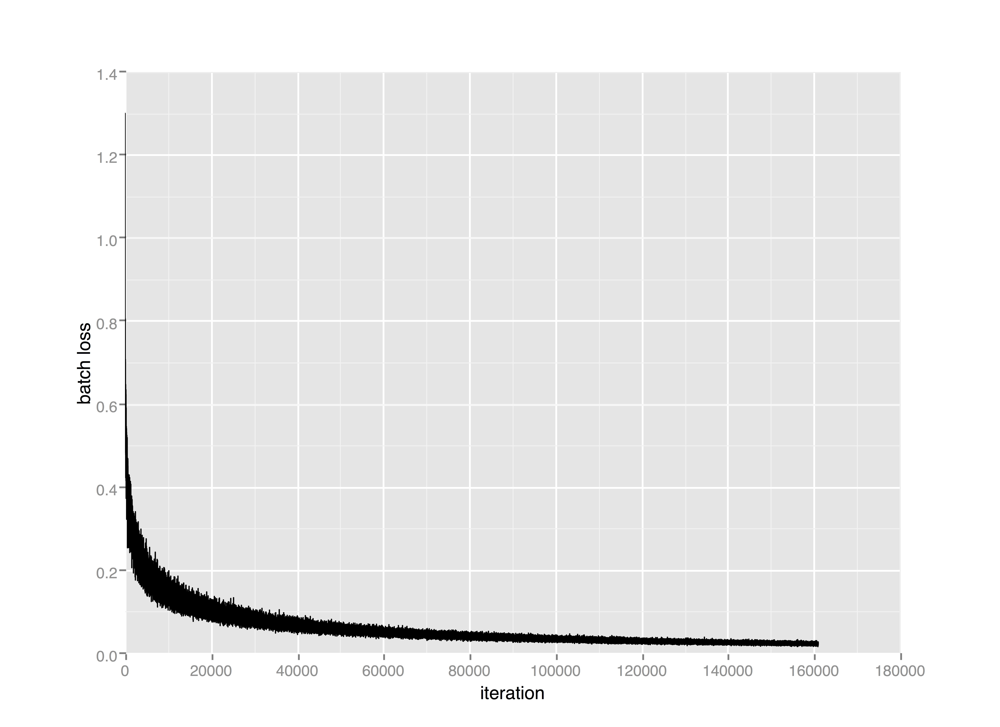

In [164]:
loss_file_name = result_dir + 'batch_loss.jpg'
Image(filename=loss_file_name, width=900)

### 4.2 Show the loss at the end of each epoch

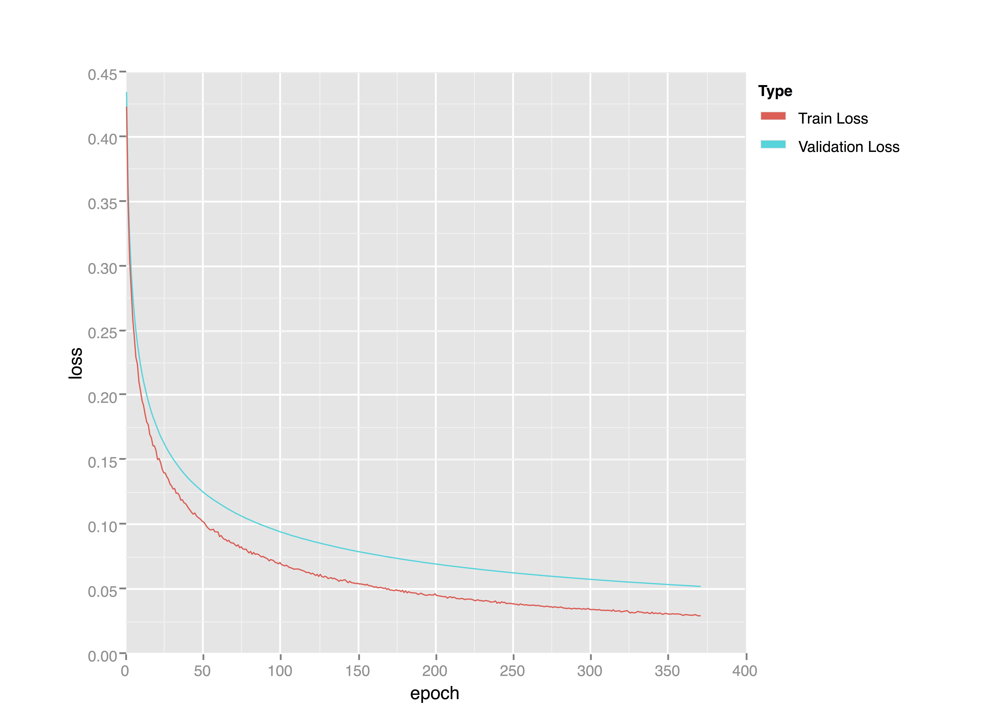

In [165]:
loss_file_name = result_dir + 'loss.jpg'
Image(filename=loss_file_name, width=900)

### 3.3 Show the images with joints
- The first row is the original images with ground truth joints
- The second row is the transformed images (resize to 220x220) with transformed groud truth joints
- The third row is the transformed images with predict joints which is trained by transformed images

In [166]:
from my_scripts.data_utils import Patch_Extraction
patch_extraction = Patch_Extraction()
X_train_plot, y_train_plot = patch_extraction.extract_imgs(train_show, data_dir, trans)
X_test_plot, y_test_plot = patch_extraction.extract_imgs(test_show, data_dir, trans)

100% (5 of 5) |###########################| Elapsed Time: 0:00:00 Time: 0:00:00
100% (5 of 5) |###########################| Elapsed Time: 0:00:00 Time: 0:00:00


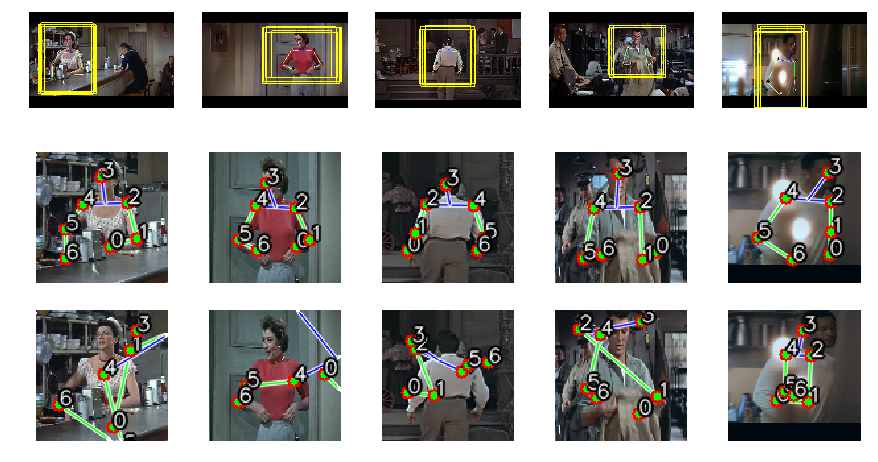

In [167]:
# Show train images
from my_scripts.test_flic_dataset import draw_joints
_, preds = trained_model.forward(X_train_plot, y_train_plot, train=False)

ori_imgs = np.zeros((N, 480, 720, 3))
tran_imgs = np.zeros((N, size, size, 3))
pred_imgs = np.zeros((N, size, size, 3))
num_bounding_box = 5

for i, x in enumerate(train_show):
    x = x.strip().split(',')
    img_file_name = '%s/images/%s' % (data_dir, x[0])
    ori_joints = np.array([int(float(p)) for p in x[1:]])
    ori_img = cv.imread(img_file_name)
    # draw joints
    draw_ori_joints = zip(ori_joints[0::2], ori_joints[1::2])
    ori_img_joints = draw_joints(ori_img.copy(), draw_ori_joints)

    # get bounding box
    for j in xrange(num_bounding_box):
        trans._img = ori_img
        trans._joints = ori_joints
        x, y, w, h = trans.crop()
        # draw bouding box
        cv.rectangle(ori_img_joints, (x, y), (x + w, y+h), (0, 255, 255), thickness=3)
    ori_imgs[i] = ori_img_joints

    # tranformed image
    tran_img, tran_joints = trans.transform(img_file_name, ori_img.copy(), ori_joints.copy())
    tran_img_rev, tran_joints_rev = trans.revert(tran_img.copy(), tran_joints)
    draw_tran_joints = [tuple(p) for p in tran_joints_rev] # must tuple in opencv
    tran_imgs[i] = draw_joints(tran_img_rev.copy(), draw_tran_joints)

    # predict image
    pred_joints = preds.data[i]  # just one image
    _, pred_joints_rev = trans.revert(tran_img.copy(), pred_joints)
    draw_pred_joints = [tuple(p) for p in pred_joints_rev]
    pred_imgs[i] = draw_joints(tran_img_rev.copy(), draw_pred_joints)

for y in xrange(3):
    for i in xrange(N):
        plt_idx = y * N + i + 1
        plt.subplot(3, N, plt_idx)
        if y == 0:  # show original image
            b,g,r = cv.split(ori_imgs[i])  # get b,g,r
        elif y == 1:  # transform image
            b,g,r = cv.split(tran_imgs[i])
        else:  # predict joints
            b,g,r = cv.split(pred_imgs[i])
        rgb_img = cv.merge([r,g,b])   
        plt.imshow(rgb_img.astype('uint8'))
        plt.axis('off')
plt.show()


for i in xrange(len(mask)):
    x = train_info[mask[i]]
    x = x.strip().split(',')
    img_file_name = '%s/images/%s' % (data_dir, x[0])
    ori_img = cv.imread(img_file_name)
    ori_joints = np.array([int(float(p)) for p in x[1:]])
    # transform, i.e., cropping
    tran_img, tran_joints = trans.transform(img_file_name, ori_img.copy(), ori_joints.copy())
    _, rev_pred_joints = trans.revert(tran_img, preds.data[i])

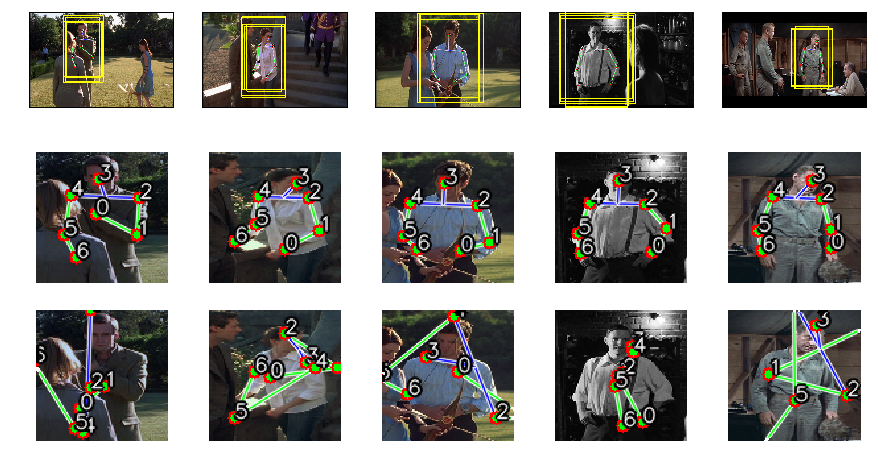

In [168]:
# Show train images
from my_scripts.test_flic_dataset import draw_joints
_, preds = trained_model.forward(X_test_plot, y_test_plot, train=False)

ori_imgs = np.zeros((N, 480, 720, 3))
tran_imgs = np.zeros((N, size, size, 3))
pred_imgs = np.zeros((N, size, size, 3))
num_bounding_box = 5

for i, x in enumerate(test_show):
    x = x.strip().split(',')
    img_file_name = '%s/images/%s' % (data_dir, x[0])
    ori_joints = np.array([int(float(p)) for p in x[1:]])
    ori_img = cv.imread(img_file_name)
    # draw joints
    draw_ori_joints = zip(ori_joints[0::2], ori_joints[1::2])
    ori_img_joints = draw_joints(ori_img.copy(), draw_ori_joints)

    # get bounding box
    for j in xrange(num_bounding_box):
        trans._img = ori_img
        trans._joints = ori_joints
        x, y, w, h = trans.crop()
        # draw bouding box
        cv.rectangle(ori_img_joints, (x, y), (x + w, y+h), (0, 255, 255), thickness=3)
    ori_imgs[i] = ori_img_joints

    # tranformed image
    tran_img, tran_joints = trans.transform(img_file_name, ori_img.copy(), ori_joints.copy())
    tran_img_rev, tran_joints_rev = trans.revert(tran_img.copy(), tran_joints)
    draw_tran_joints = [tuple(p) for p in tran_joints_rev] # must tuple in opencv
    tran_imgs[i] = draw_joints(tran_img_rev.copy(), draw_tran_joints)

    # predict image
    pred_joints = preds.data[i]  # just one image
    _, pred_joints_rev = trans.revert(tran_img.copy(), pred_joints)
    draw_pred_joints = [tuple(p) for p in pred_joints_rev]
    pred_imgs[i] = draw_joints(tran_img_rev.copy(), draw_pred_joints)

for y in xrange(3):
    for i in xrange(N):
        plt_idx = y * N + i + 1
        plt.subplot(3, N, plt_idx)
        if y == 0:  # show original image
            b,g,r = cv.split(ori_imgs[i])  # get b,g,r
        elif y == 1:  # transform image
            b,g,r = cv.split(tran_imgs[i])
        else:  # predict joints
            b,g,r = cv.split(pred_imgs[i])
        rgb_img = cv.merge([r,g,b])   
        plt.imshow(rgb_img.astype('uint8'))
        plt.axis('off')
plt.show()


for i in xrange(len(mask)):
    x = train_info[mask[i]]
    x = x.strip().split(',')
    img_file_name = '%s/images/%s' % (data_dir, x[0])
    ori_img = cv.imread(img_file_name)
    ori_joints = np.array([int(float(p)) for p in x[1:]])
    # transform, i.e., cropping
    tran_img, tran_joints = trans.transform(img_file_name, ori_img.copy(), ori_joints.copy())
    _, rev_pred_joints = trans.revert(tran_img, preds.data[i])